<a href="https://colab.research.google.com/github/neuralsrg/SupervisedLearning/blob/main/Tensorflow/%5Bu_net%5Dsemantic_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Semantic Segmentation

## Dataset



*   We will load `CARLA semantic segmentation dataset` from `kaggle`

    1.  Create `kaggle authentication token` in kaggle --> account
    2.  Load `kaggle.json` here using `files.upload()`
    3.  Put it into `~/.kaggle/`
    4.  Set owner's permission to `r&w` (600)
    5.  Download dataset with 
    `! kaggle datasets download -d {owner}/{dataset_name}-p {/download/path}`


*   Create `tf.Data.dataset` from the loaded images

In [1]:
! nvidia-smi

Mon Jul 25 18:34:01 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
! pip install -q kaggle

# upload kaggle.json -- kaggle authentication token
from google.colab import files
files.upload()

# kaggle authentication key
! mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

# dataset dir
! mkdir /content/CARLA

In [3]:
# downloading kaggle dataset using kaggle api
! kaggle datasets download -d kumaresanmanickavelu/lyft-udacity-challenge -p /content/CARLA

100% 5.09G/5.11G [00:35<00:00, 149MB/s]
100% 5.11G/5.11G [00:35<00:00, 154MB/s]


In [4]:
# extracting files from zip
import zipfile
with zipfile.ZipFile('/content/CARLA/lyft-udacity-challenge.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/CARLA/extracted')

In [5]:
! du -sh /content/CARLA

11G	/content/CARLA


In [6]:
import os

# path to extracted files
path = '/content/CARLA/extracted'

# lets check dataA folder
image_path = os.path.join(path, './dataA/dataA/CameraRGB/')
seg_path = os.path.join(path, './dataA/dataA/CameraSeg/')

In [7]:
# list of images insied there 2 dirs
image_list = os.listdir(image_path)
seg_list = os.listdir(seg_path)

# full paths
image_list = [image_path + i for i in image_list]
mask_list = [seg_path + i for i in seg_list]

img shape: (600, 800, 3)
mask shape: (600, 800, 3)


(-0.5, 799.5, 599.5, -0.5)

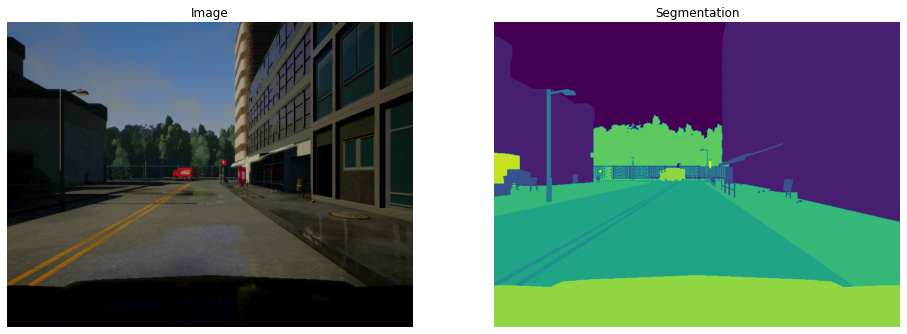

In [8]:
# viewing image with its segmentation mask

import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
plt.rcParams['figure.figsize'] = [16, 8]

img = imread(image_list[32])
mask = imread(mask_list[32])
print(f'img shape: {img.shape}')
print(f'mask shape: {mask.shape}')

fig = plt.figure()

ax = fig.add_subplot(121)
ax.imshow(img)
ax.set_title('Image')
plt.axis('off')

ax = fig.add_subplot(122)
ax.imshow(mask[:, :, 0])
ax.set_title('Segmentation')
plt.axis('off')

In [9]:
def plot(images):
  """
  Plots images

  Arguments:
  images -- list of images to be plotted

  Returns:
  None
  """
  titles = ['Image', 'Segmentation', 'Predicted Segmentation']
  n = len(images)
  fig = plt.figure()

  for i, img in enumerate(images):
    ax = fig.add_subplot(1, n, i + 1)
    plt.axis('off')
    plt.title(titles[i] if i in range(3) else None)
    # to PIL image
    ax.imshow(tf.keras.utils.array_to_img(img))
  
  plt.show()

## Tensorflow dataset

In [10]:
# we have 5 sets:
path = '/content/CARLA/extracted'
folders = [dir for dir in os.listdir(path) if dir[-1] in ['A', 'B', 'C', 'D', 'E']]
folders

['dataC', 'dataE', 'dataB', 'dataD', 'dataA']

In [11]:
# get folders
image_folders = [os.path.join(path, folder, folder, './CameraRGB') for folder in folders]
mask_folders = [os.path.join(path, folder, folder, './CameraSeg') for folder in folders]

In [12]:
# full file paths
images = [os.path.join(folder, img) for folder in image_folders for img in os.listdir(folder)]
masks = [os.path.join(folder, img) for folder in mask_folders for img in os.listdir(folder)]

len(images), len(masks)

(5000, 5000)

In [13]:
import tensorflow as tf
import numpy as np

In [14]:
image_filenames = tf.constant(images)
masks_filenames = tf.constant(masks)

dataset = tf.data.Dataset.from_tensor_slices((image_filenames, masks_filenames))

# check whether the files correspond to each other
for img, mask in dataset.take(3):
  print(img)
  print(mask)

tf.Tensor(b'/content/CARLA/extracted/dataC/dataC/./CameraRGB/F2-65.png', shape=(), dtype=string)
tf.Tensor(b'/content/CARLA/extracted/dataC/dataC/./CameraSeg/F2-65.png', shape=(), dtype=string)
tf.Tensor(b'/content/CARLA/extracted/dataC/dataC/./CameraRGB/F4-35.png', shape=(), dtype=string)
tf.Tensor(b'/content/CARLA/extracted/dataC/dataC/./CameraSeg/F4-35.png', shape=(), dtype=string)
tf.Tensor(b'/content/CARLA/extracted/dataC/dataC/./CameraRGB/08_00_075.png', shape=(), dtype=string)
tf.Tensor(b'/content/CARLA/extracted/dataC/dataC/./CameraSeg/08_00_075.png', shape=(), dtype=string)


### Preprocessing

In [15]:
# paths preprocessing

@tf.function
def preprocess_path(image_path, mask_path):
  img = tf.io.read_file(image_path)
  mask = tf.io.read_file(mask_path)

  # decode a PNG-encoded image to a uint8 tensor
  img = tf.image.decode_png(img, channels=3)
  mask = tf.image.decode_png(mask, channels=3)

  img = tf.image.convert_image_dtype(img, tf.float32)

  # for mask take max over channels
  mask = tf.math.reduce_max(mask, axis=-1, keepdims=True)

  return img, mask

dataset = dataset.map(preprocess_path)

In [16]:
# preprocess images

@tf.function
def preprocess_image(image, mask):
  image = tf.image.resize(image, (96, 128), method='nearest') / 255.
  mask = tf.image.resize(mask, (96, 128), method='nearest')

  return image, mask

dataset = dataset.map(preprocess_image)

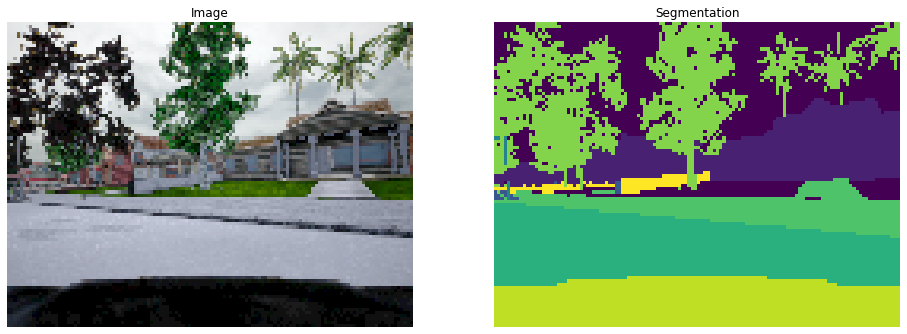

In [17]:
# plotting new format

for img, mask in dataset.take(1):
  plot([img, mask])

## U-NET

U-NET unlike `Fully Convolutional Network (FCN)` uses skip connections to keep the spatial information and a matching number of convolutions for downsampling the input image to a feature map, and transposed convolutions for upsampling those maps back up to the original input image size. Skip connections also prevent model from overfitting by sending information to every upsampling layer in the decoder from the corresponding downsampling layer in the encoder

![picture](https://i.imgur.com/Ef03vzn.png)

Here, we will build U-NET from scratch

### Contracting path (Encoder)

It consists of the repeated application of `two 3x3 same convolutions`, each followed by a `ReLU` and a `2x2 max pooling operation with stride 2` for downsampling. At each downsampling step, the number of feature channels is `doubled`.

Each downsampling step is designed here as `conv_block()`



![image](https://i.imgur.com/J1tMjEN.png)

In [18]:
def conv_block(inputs, n_filters=32, dropout_rate=0, max_pooling=True):
  """
  Convolutional downsampling block
  
  Arguments:
      inputs -- Input tensor
      n_filters -- Number of filters for the convolutional layers
      dropout_rate -- Fraction of the input units to drop
      max_pooling -- Boolean, use MaxPooling2D to reduce the spatial dimensions of the output volume

  Returns: 
      next_layer, skip_connection --  Next layer and skip connection outputs
  """

  conv = tf.keras.layers.Conv2D(n_filters, kernel_size=3, activation='relu',
                                padding='same', kernel_initializer= 'he_normal')(inputs)
  conv = tf.keras.layers.Conv2D(n_filters, kernel_size=3, activation='relu',
                                padding='same', kernel_initializer= 'he_normal')(conv)

  if dropout_rate > 0:
    conv = tf.keras.layers.Dropout(dropout_rate)(conv)

  next_layer = tf.keras.layers.MaxPooling2D(2, strides=2)(conv) if max_pooling else conv
  skip_connection = conv
  
  return next_layer, skip_connection

### Expanding path (Decoder)

Each step in the expanding path upsamples the feature map, followed by a `2x2 transposed convolution`. This transposed convolution halves the number of feature channels, while growing the height and width of the image.

Next is a `concatenation` with the correspondingly cropped feature map from the contracting path, and `two 3x3 convolutions`, each followed by a `ReLU`.

In [19]:
def upsampling_block(expansive_input, contractive_input, n_filters=32):
    """
    Convolutional upsampling block
    
    Arguments:
        expansive_input -- Input tensor from previous layer
        contractive_input -- Input tensor from previous skip layer
        n_filters -- Number of filters for the convolutional layers

    Returns: 
        conv -- Tensor output
    """

    up = tf.keras.layers.Conv2DTranspose(n_filters, kernel_size=3, strides=2,
                         padding='same')(expansive_input)
    
    # concatenate along channels axis
    merge = tf.keras.layers.concatenate([up, contractive_input], axis=-1)
    
    conv = tf.keras.layers.Conv2D(n_filters, kernel_size=3, activation='relu',
                                  padding='same', kernel_initializer= 'he_normal')(merge)
    conv = tf.keras.layers.Conv2D(n_filters, kernel_size=3, activation='relu',
                                  padding='same', kernel_initializer= 'he_normal')(conv)
    
    return conv

### Building model

In [20]:
def create_model(input_size=(96, 128, 3), n_filters=32, n_classes=23):
  """
  Unet model
  
  Arguments:
      input_size -- Input shape 
      n_filters -- Number of filters for the convolutional layers
      n_classes -- Number of output classes

  Returns: 
      model -- tf.keras.Model
  """

  # encoder
  inputs = tf.keras.layers.Input(input_size)

  cblock1, cache1 = conv_block(inputs=inputs, n_filters=n_filters)
  cblock2, cache2 = conv_block(inputs=cblock1, n_filters=n_filters*2)
  cblock3, cache3 = conv_block(inputs=cblock2, n_filters=n_filters*4)

  cblock4, cache4 = conv_block(inputs=cblock3, n_filters=n_filters*8,
                               dropout_rate=0.3)
  
  # bottleneck (no skip connection)
  cblock5, _ = conv_block(inputs=cblock4, n_filters=n_filters*16,
                          dropout_rate=0.3, max_pooling=False) 

  # decoder
  ublock6 = upsampling_block(cblock5, cache4, n_filters*8)
  ublock7 = upsampling_block(ublock6, cache3, n_filters*4)
  ublock8 = upsampling_block(ublock7, cache2, n_filters*2)
  ublock9 = upsampling_block(ublock8, cache1, n_filters)

  conv9 = tf.keras.layers.Conv2D(n_filters, kernel_size=3, activation='relu',
                                 padding='same', kernel_initializer='he_normal')(ublock9)

  # final conv for predicting classes
  conv10 = tf.keras.layers.Conv2D(n_classes, kernel_size=1, padding='same')(conv9)
  
  model = tf.keras.Model(inputs=inputs, outputs=conv10)

  return model

In [21]:
unet = create_model()
unet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 96, 128, 3)  0           []                               
                                ]                                                                 
                                                                                                  
 conv2d (Conv2D)                (None, 96, 128, 32)  896         ['input_1[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 96, 128, 32)  9248        ['conv2d[0][0]']                 
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 48, 64, 32)   0           ['conv2d_1[0][0]']           

In [22]:
unet.compile(optimizer='adam',
             # since we did not apply softmax, we set from_logits=True
             loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
             metrics=['accuracy'])

In [23]:
# preparing dataset
num_samples = dataset.cardinality().numpy()
dataset = dataset.shuffle(500)

train_ds = dataset.skip(num_samples // 5)
dev_ds = dataset.take(num_samples // 5)

train_ds.cardinality().numpy(), dev_ds.cardinality().numpy()

(4000, 1000)

In [24]:
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().batch(BATCH_SIZE).prefetch(AUTOTUNE)
dev_ds = dev_ds.cache().batch(BATCH_SIZE).prefetch(AUTOTUNE)

### Training

In [25]:
log_dir = "/content/CARLA/logs"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

history = unet.fit(train_ds,
                   epochs=50,
                   validation_data=dev_ds,
                   callbacks=[tensorboard_callback])

Epoch 1/50
125/125 [==============================] - 183s 1s/step - loss: 1.5518 - accuracy: 0.4941 - val_loss: 0.6884 - val_accuracy: 0.7689
Epoch 2/50
125/125 [==============================] - 21s 169ms/step - loss: 0.5722 - accuracy: 0.7967 - val_loss: 0.5242 - val_accuracy: 0.8194
Epoch 3/50
125/125 [==============================] - 22s 177ms/step - loss: 0.4595 - accuracy: 0.8503 - val_loss: 0.4020 - val_accuracy: 0.8714
Epoch 4/50
125/125 [==============================] - 23s 185ms/step - loss: 0.3705 - accuracy: 0.8800 - val_loss: 0.3307 - val_accuracy: 0.8918
Epoch 5/50
125/125 [==============================] - 22s 176ms/step - loss: 0.3092 - accuracy: 0.8976 - val_loss: 0.2870 - val_accuracy: 0.9041
Epoch 6/50
125/125 [==============================] - 23s 183ms/step - loss: 0.2670 - accuracy: 0.9098 - val_loss: 0.2523 - val_accuracy: 0.9139
Epoch 7/50
125/125 [==============================] - 24s 189ms/step - loss: 0.2408 - accuracy: 0.9172 - val_loss: 0.2326 - val_accu

In [26]:
# saving model for further evaluation
from google.colab import drive
drive.mount('/content/drive')

unet.save('/content/drive/MyDrive/CARLA/unet.h5')

Mounted at /content/drive


In [34]:
! cp -r /content/CARLA/logs /content/drive/MyDrive/CARLA/logs

In [123]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/CARLA/logs

<IPython.core.display.Javascript object>

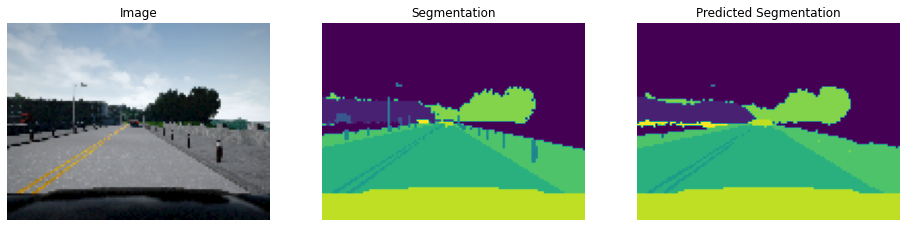

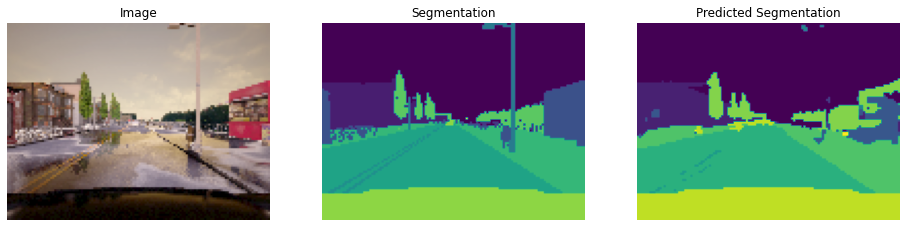

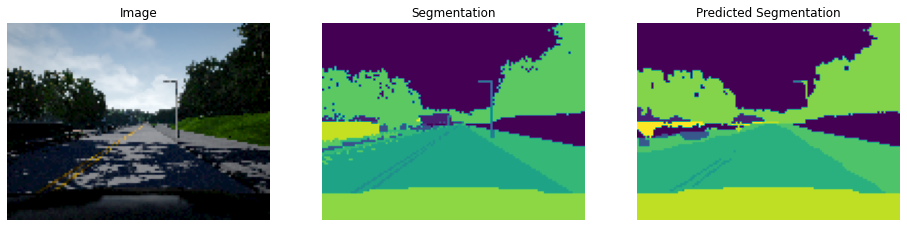

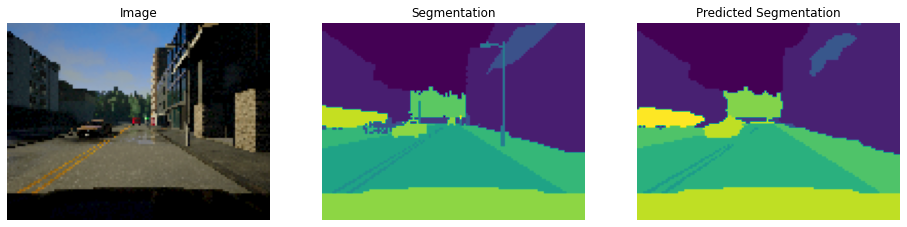

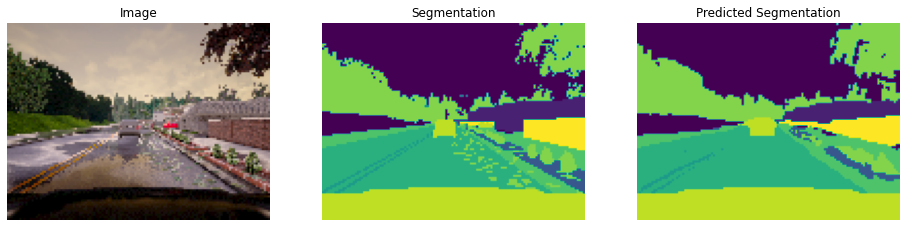

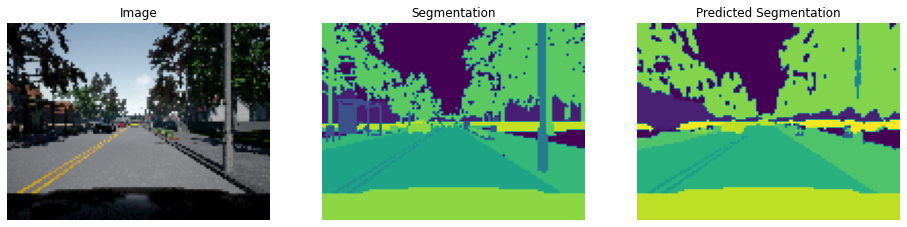

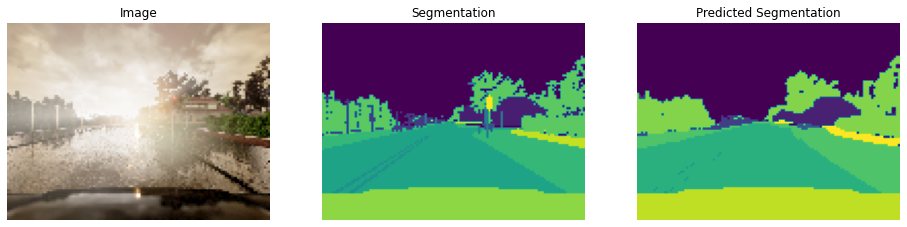

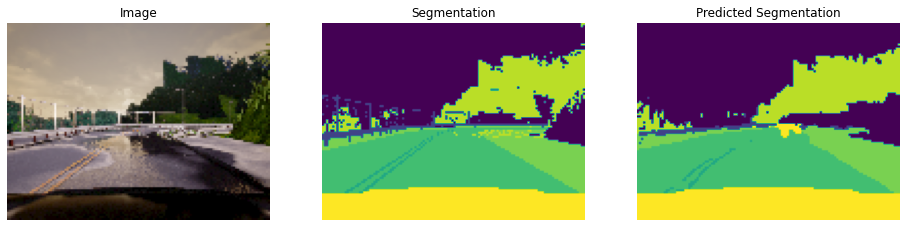

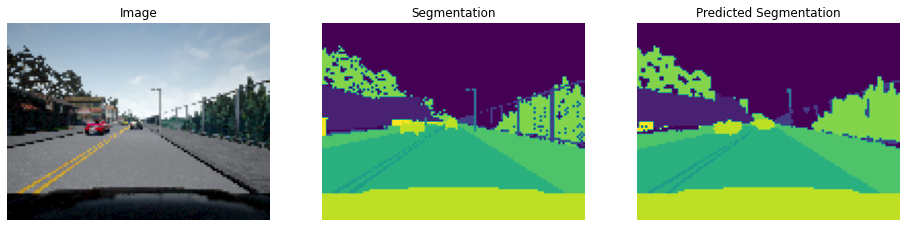

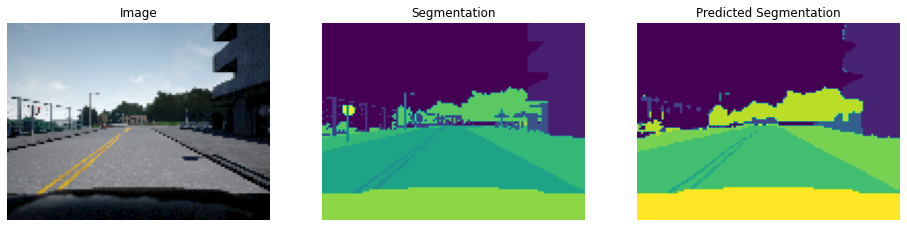

In [32]:
for img, mask in dev_ds.take(1):
  prediction = unet.predict(img)
  prediction = tf.argmax(prediction, axis=-1)
  prediction = prediction[..., tf.newaxis]

  for i in range(10):
    plot([img[i], mask[i, :, :, 0][..., tf.newaxis], prediction[i]])

## Testing on random image from net

In [147]:
! wget https://i.imgur.com/k034ilv.png -P /content/CARLA/image

--2022-07-25 20:16:30--  https://i.imgur.com/k034ilv.png
Resolving i.imgur.com (i.imgur.com)... 146.75.92.193
Connecting to i.imgur.com (i.imgur.com)|146.75.92.193|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 374703 (366K) [image/png]
Saving to: ‘/content/CARLA/image/k034ilv.png’

k034ilv.png         100%[===================>] 365.92K  --.-KB/s    in 0.02s   

2022-07-25 20:16:30 (18.6 MB/s) - ‘/content/CARLA/image/k034ilv.png’ saved [374703/374703]



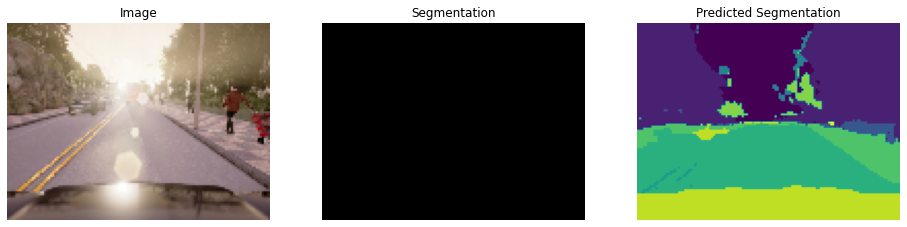

In [148]:
img = tf.io.read_file('/content/CARLA/image/k034ilv.png')
img = tf.image.decode_png(img, channels=3)
img = tf.image.convert_image_dtype(img, tf.float32)
img = tf.image.resize(img, (96, 128), method='nearest') / 255.

prediction = unet.predict(img[tf.newaxis, ...])
prediction = tf.argmax(prediction, axis=-1)
prediction = prediction[..., tf.newaxis]

plot([img, np.zeros_like(img), prediction[0]])